# Optimización de cartera | Benchmarking

### Benchmark a vencer: 25/25/25/25
- SPY
- GOLD
- TLT
- Cash

## Datos históricos desde 2015

In [13]:
# ===============================
# Datos para Markowitz (CASH = 0%)
# ===============================

import pandas as pd
import numpy as np
import yfinance as yf
from datetime import datetime

# ---------- Parámetros ----------
START = "2015-01-01"
END   = datetime.today().strftime("%Y-%m-%d")
TICKERS = ["SPY", "GLD", "TLT"]   # activos con precio
FREQ = "D"                        # "D" diario (hábiles), "W-FRI" semanal, "M" mensual

# ---------- Helpers ----------
def _periods_per_year(freq: str) -> int:
    if freq == "D": return 252
    if freq.startswith("W"): return 52
    if freq == "M": return 12
    return 252

def _enforce_frequency_prices(px: pd.DataFrame, freq: str) -> pd.DataFrame:
    if freq == "D":
        # días hábiles con forward-fill para feriados
        return px.asfreq("B").ffill()
    else:
        # semanal/mensual: último precio del período
        return px.resample(freq).last().ffill()

# ---------- 1) Descarga robusta (por ticker) ----------
# Evitamos MultiIndex: bajamos cada ticker y concatenamos columnas "Adj Close"
cols = []
for t in TICKERS:
    df = yf.download(t, start=START, end=END, auto_adjust=False, progress=False)
    if "Adj Close" in df.columns:
        s = df["Adj Close"].copy()
        s.name = t
    elif "Close" in df.columns:
        s = df["Close"].copy()
        s.name = t
    else:
        raise KeyError(f"No se encontró 'Adj Close' ni 'Close' para {t}.")
    cols.append(s)

px = pd.concat(cols, axis=1).dropna(how="all")

# ---------- 2) Ajuste de frecuencia ----------
px = _enforce_frequency_prices(px, FREQ)

# ---------- 3) Retornos ----------
ret_assets = px.pct_change().dropna()

# CASH = 0% por período (constante)
returns = ret_assets.copy()
returns["CASH"] = 0.0
# Reordenamos columnas para quedar SPY, GLD, TLT, CASH
returns = returns[["SPY", "GLD", "TLT", "CASH"]]

# ---------- 4) Estadísticos anualizados ----------
scale = _periods_per_year(FREQ)
mu_annual = returns.mean() * scale
Sigma_annual = returns.cov() * scale
# (CASH tiene var=0 y cov=0 automáticamente porque su serie es constante)

# ---------- 5) Guardar archivos ----------
returns.to_csv("returns_used.csv")                 # retornos por fecha SPY/GLD/TLT/CASH
mu_annual.to_csv("mu_annual.csv", header=["mu"])  # vector μ anualizado
Sigma_annual.to_csv("Sigma_annual.csv")           # matriz Σ anualizada

print("✅ Descarga y preparación OK (CASH=0%)")
print(f"Ventana: {returns.index[0].date()} → {returns.index[-1].date()} | Frecuencia: {FREQ}")
print("\nμ anualizado:\n", mu_annual.round(4))
print("\nΣ anualizada (primeras filas):\n", Sigma_annual.round(6).head())

✅ Descarga y preparación OK (CASH=0%)
Ventana: 2015-01-05 → 2025-10-27 | Frecuencia: D

μ anualizado:
 Ticker
SPY     0.1394
GLD     0.1148
TLT     0.0072
CASH    0.0000
dtype: float64

Σ anualizada (primeras filas):
 Ticker       SPY       GLD       TLT  CASH
Ticker                                    
SPY     0.030811  0.001032 -0.004884   0.0
GLD     0.001032  0.020772  0.006138   0.0
TLT    -0.004884  0.006138  0.022067   0.0
CASH    0.000000  0.000000  0.000000   0.0


### Markoitz (óptimo con CML) con media histórica


=== Pesos óptimos (Markowitz, CASH=0%) ===
       w_MSR  w_GMV  mu_hist
SPY   0.4477    0.0   0.1394
GLD   0.5469    0.0   0.1148
TLT  -0.0000    0.0   0.0072
CASH  0.0054    1.0   0.0000

=== Métricas (anualizadas) ===
rf (CASH)         : 0.0000
GMV  Ret / Vol    : 0.0000 / 0.0000 | Sharpe = 0.000
MSR  Ret / Vol    : 0.1252 / 0.1135 | Sharpe = 1.103


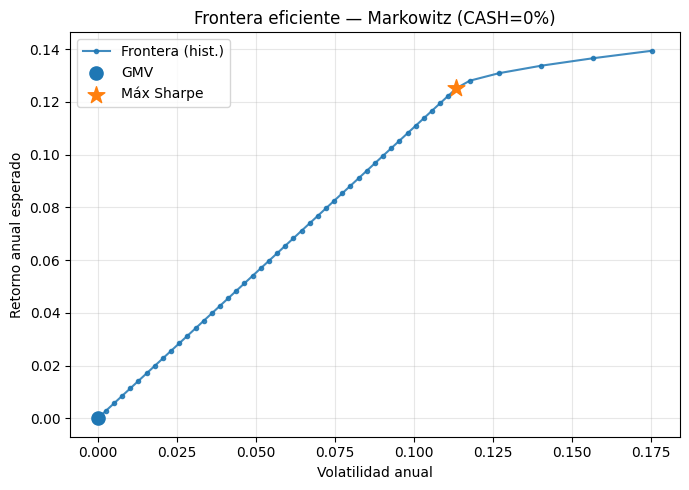

In [15]:

import numpy as np
import pandas as pd
import cvxpy as cp
import matplotlib.pyplot as plt

# 1) Cargar μ y Σ (ANUALIZADOS) 
mu = pd.read_csv("mu_annual.csv", index_col=0).squeeze("columns")
Sigma = pd.read_csv("Sigma_annual.csv", index_col=0)

assets = ["SPY", "GLD", "TLT", "CASH"]
mu = mu.reindex(assets)
Sigma = Sigma.reindex(index=assets, columns=assets)


mu.loc["CASH"] = 0.0
Sigma.loc["CASH", :] = 0.0
Sigma.loc[:, "CASH"] = 0.0

S = Sigma.values.astype(float)
N = len(assets)
rf = 0.0  # <-- CASH = 0%


ridge = 1e-10
S = S + ridge * np.eye(N)

# --- 3) GMV (mínima varianza) ---
w_gmv = cp.Variable(N)
prob_gmv = cp.Problem(cp.Minimize(cp.quad_form(w_gmv, S)),
                      [cp.sum(w_gmv) == 1, w_gmv >= 0])
prob_gmv.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, verbose=False)
w_gmv = w_gmv.value
ret_gmv = float(mu.values @ w_gmv)
vol_gmv = float(np.sqrt(w_gmv @ S @ w_gmv))
sharpe_gmv = (ret_gmv - rf) / vol_gmv if vol_gmv > 0 else np.nan

# --- 4) Frontera eficiente (min var para retornos objetivo) ---
mu_vals = mu.values
mu_min = max(0.0, ret_gmv)
mu_max = float(mu_vals.max())
targets = np.linspace(mu_min, mu_max, 50)

rets, vols, weights = [], [], []
for r_target in targets:
    w = cp.Variable(N)
    cons = [cp.sum(w) == 1, w >= 0, mu_vals @ w >= r_target]
    obj = cp.Minimize(cp.quad_form(w, S))
    prob = cp.Problem(obj, cons)
    prob.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, max_iter=200000, verbose=False)
    w_opt = w.value
    if w_opt is None:
        rets.append(np.nan); vols.append(np.nan); weights.append(None); continue
    rp = float(mu_vals @ w_opt)
    sp = float(np.sqrt(w_opt @ S @ w_opt))
    rets.append(rp); vols.append(sp); weights.append(w_opt)

rets = np.array(rets, dtype=float)
vols = np.array(vols, dtype=float)
sharpe = np.where(vols > 0, (rets - rf) / vols, np.nan)

# --- 5) Elegir Máximo Sharpe ---
idx = int(np.nanargmax(sharpe))
w_msr = weights[idx]
ret_msr, vol_msr, sharpe_msr = rets[idx], vols[idx], sharpe[idx]

# --- 6) Resultados ---
res = pd.DataFrame({
    "w_MSR": w_msr,
    "w_GMV": w_gmv,
    "mu_hist": mu.values
}, index=assets)

print("\n=== Pesos óptimos (Markowitz, CASH=0%) ===")
print(res.round(4))
print("\n=== Métricas (anualizadas) ===")
print(f"rf (CASH)         : {rf:.4f}")
print(f"GMV  Ret / Vol    : {ret_gmv:.4f} / {vol_gmv:.4f} | Sharpe = {sharpe_gmv:.3f}")
print(f"MSR  Ret / Vol    : {ret_msr:.4f} / {vol_msr:.4f} | Sharpe = {sharpe_msr:.3f}")

# --- 7) (Opcional) gráfico ---
try:
    plt.figure(figsize=(7,5))
    plt.plot(vols, rets, marker='.', linestyle='-', alpha=0.85, label='Frontera (hist.)')
    plt.scatter(vol_gmv, ret_gmv, marker='o', s=90, label='GMV', zorder=3)
    plt.scatter(vol_msr, ret_msr, marker='*', s=160, label='Máx Sharpe', zorder=3)
    plt.xlabel('Volatilidad anual')
    plt.ylabel('Retorno anual esperado')
    plt.title('Frontera eficiente — Markowitz (CASH=0%)')
    plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()
except Exception as e:
    print("(Nota) No se pudo graficar:", e)


## Análisis corto

### Markowitz con media del último mes (~22 días)


Ventana usada: últimos 22 días (2025-09-26 → 2025-10-27)

=== Pesos óptimos (Markowitz, último mes) ===
       w_MSR  w_GMV  mu_last_month
SPY   0.3504    0.0         0.0215
GLD   0.0310   -0.0         0.0351
TLT   0.6184    0.0         0.0181
CASH  0.0002    1.0         0.0000

=== Métricas (anualizadas) ===
rf (CASH)         : 0.0000
GMV  Ret / Vol    : 0.0000 / 0.0000 | Sharpe = 0.002
MSR  Ret / Vol    : 0.0198 / 0.0095 | Sharpe = 2.084


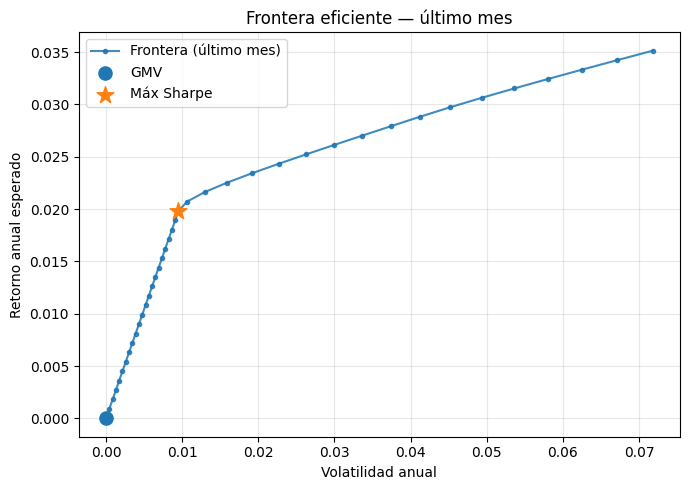

In [16]:
import numpy as np
import pandas as pd
import cvxpy as cp
import matplotlib.pyplot as plt


returns = pd.read_csv("returns_used.csv", index_col=0, parse_dates=True)

window = 22
returns_recent = returns.tail(window)


scale = 252 / window  # para anualizar: ~252 días/año
mu_recent = returns_recent.mean() * scale
Sigma_recent = returns_recent.cov() * scale

# Forzar CASH = 0% retorno y 0 riesgo
mu_recent.loc["CASH"] = 0.0
Sigma_recent.loc["CASH", :] = 0.0
Sigma_recent.loc[:, "CASH"] = 0.0

assets = ["SPY", "GLD", "TLT", "CASH"]
mu_recent = mu_recent.reindex(assets)
Sigma_recent = Sigma_recent.reindex(index=assets, columns=assets)
S = Sigma_recent.values
N = len(assets)
rf = 0.0


ridge = 1e-10
S = S + ridge * np.eye(N)

# GMV
w_gmv = cp.Variable(N)
prob_gmv = cp.Problem(cp.Minimize(cp.quad_form(w_gmv, S)),
                      [cp.sum(w_gmv) == 1, w_gmv >= 0])
prob_gmv.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, verbose=False)
w_gmv = w_gmv.value
ret_gmv = float(mu_recent.values @ w_gmv)
vol_gmv = float(np.sqrt(w_gmv @ S @ w_gmv))
sharpe_gmv = (ret_gmv - rf) / vol_gmv if vol_gmv > 0 else np.nan

# Frontera y Máximo Sharpe
mu_vals = mu_recent.values
mu_min = max(0.0, ret_gmv)
mu_max = float(mu_vals.max())
targets = np.linspace(mu_min, mu_max, 40)

rets, vols, weights = [], [], []
for r_target in targets:
    w = cp.Variable(N)
    cons = [cp.sum(w) == 1, w >= 0, mu_vals @ w >= r_target]
    obj = cp.Minimize(cp.quad_form(w, S))
    prob = cp.Problem(obj, cons)
    prob.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, verbose=False)
    w_opt = w.value
    if w_opt is None:
        rets.append(np.nan); vols.append(np.nan); weights.append(None); continue
    rp = float(mu_vals @ w_opt)
    sp = float(np.sqrt(w_opt @ S @ w_opt))
    rets.append(rp); vols.append(sp); weights.append(w_opt)

rets = np.array(rets, dtype=float)
vols = np.array(vols, dtype=float)
sharpe = np.where(vols > 0, (rets - rf) / vols, np.nan)
idx = int(np.nanargmax(sharpe))
w_msr = weights[idx]
ret_msr, vol_msr, sharpe_msr = rets[idx], vols[idx], sharpe[idx]

# --- 4) Resultados ---
res = pd.DataFrame({
    "w_MSR": w_msr,
    "w_GMV": w_gmv,
    "mu_last_month": mu_recent.values
}, index=assets)

print(f"\nVentana usada: últimos {window} días ({returns_recent.index[0].date()} → {returns_recent.index[-1].date()})")
print("\n=== Pesos óptimos (Markowitz, último mes) ===")
print(res.round(4))
print("\n=== Métricas (anualizadas) ===")
print(f"rf (CASH)         : {rf:.4f}")
print(f"GMV  Ret / Vol    : {ret_gmv:.4f} / {vol_gmv:.4f} | Sharpe = {sharpe_gmv:.3f}")
print(f"MSR  Ret / Vol    : {ret_msr:.4f} / {vol_msr:.4f} | Sharpe = {sharpe_msr:.3f}")

# Gráfico 
try:
    plt.figure(figsize=(7,5))
    plt.plot(vols, rets, marker='.', linestyle='-', alpha=0.85, label='Frontera (último mes)')
    plt.scatter(vol_gmv, ret_gmv, marker='o', s=90, label='GMV', zorder=3)
    plt.scatter(vol_msr, ret_msr, marker='*', s=160, label='Máx Sharpe', zorder=3)
    plt.xlabel('Volatilidad anual'); plt.ylabel('Retorno anual esperado')
    plt.title('Frontera eficiente — último mes')
    plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()
except Exception as e:
    print("(Nota) No se pudo graficar:", e)


### Análisis sin Cash -que no tiene variabilidad-

In [18]:

# Markowitz con media del último mes (~22 días)


import numpy as np
import pandas as pd
import cvxpy as cp
import matplotlib.pyplot as plt

# --- 1) Cargar retornos diarios históricos ---
returns = pd.read_csv("returns_used.csv", index_col=0, parse_dates=True)

# Usar solo SPY, GLD y TLT (sin CASH)
returns = returns[["SPY", "GLD", "TLT"]]

# Tomar último mes (~22 días hábiles)
window = 22
returns_recent = returns.tail(window)

# --- 2) Calcular μ y Σ (solo ventana reciente, anualizados) ---
scale = 252 / window  # aprox anualización
mu_recent = returns_recent.mean() * scale
Sigma_recent = returns_recent.cov() * scale

assets = ["SPY", "GLD", "TLT"]
mu_recent = mu_recent.reindex(assets)
Sigma_recent = Sigma_recent.reindex(index=assets, columns=assets)
S = Sigma_recent.values
N = len(assets)
rf = 0.0  # sin activo libre de riesgo explícito

# --- 3) Optimización GMV y MSR ---
ridge = 1e-10
S = S + ridge * np.eye(N)

# GMV (mínima varianza)
w_gmv = cp.Variable(N)
prob_gmv = cp.Problem(cp.Minimize(cp.quad_form(w_gmv, S)),
                      [cp.sum(w_gmv) == 1, w_gmv >= 0])
prob_gmv.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, verbose=False)
w_gmv = w_gmv.value
ret_gmv = float(mu_recent.values @ w_gmv)
vol_gmv = float(np.sqrt(w_gmv @ S @ w_gmv))
sharpe_gmv = (ret_gmv - rf) / vol_gmv if vol_gmv > 0 else np.nan

# Frontera eficiente y máximo Sharpe
mu_vals = mu_recent.values
mu_min = max(0.0, ret_gmv)
mu_max = float(mu_vals.max())
targets = np.linspace(mu_min, mu_max, 40)

rets, vols, weights = [], [], []
for r_target in targets:
    w = cp.Variable(N)
    cons = [cp.sum(w) == 1, w >= 0, mu_vals @ w >= r_target]
    obj = cp.Minimize(cp.quad_form(w, S))
    prob = cp.Problem(obj, cons)
    prob.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, verbose=False)
    w_opt = w.value
    if w_opt is None:
        rets.append(np.nan); vols.append(np.nan); weights.append(None); continue
    rp = float(mu_vals @ w_opt)
    sp = float(np.sqrt(w_opt @ S @ w_opt))
    rets.append(rp); vols.append(sp); weights.append(w_opt)

rets = np.array(rets, dtype=float)
vols = np.array(vols, dtype=float)
sharpe = np.where(vols > 0, (rets - rf) / vols, np.nan)
idx = int(np.nanargmax(sharpe))
w_msr = weights[idx]
ret_msr, vol_msr, sharpe_msr = rets[idx], vols[idx], sharpe[idx]

# --- 4) Resultados ---
res = pd.DataFrame({
    "w_MSR": w_msr,
    "w_GMV": w_gmv,
    "mu_last_month": mu_recent.values
}, index=assets)

print(f"\nVentana usada: últimos {window} días ({returns_recent.index[0].date()} → {returns_recent.index[-1].date()})")
print("\n=== Pesos óptimos (Markowitz, último mes, sin CASH) ===")
print(res.round(4))
print("\n=== Métricas (anualizadas) ===")
print(f"GMV  Ret / Vol    : {ret_gmv:.4f} / {vol_gmv:.4f} | Sharpe = {sharpe_gmv:.3f}")
print(f"MSR  Ret / Vol    : {ret_msr:.4f} / {vol_msr:.4f} | Sharpe = {sharpe_msr:.3f}")





Ventana usada: últimos 22 días (2025-09-26 → 2025-10-27)

=== Pesos óptimos (Markowitz, último mes, sin CASH) ===
      w_MSR   w_GMV  mu_last_month
SPY  0.3525  0.3474         0.0215
GLD  0.0398  0.0174         0.0351
TLT  0.6076  0.6352         0.0181

=== Métricas (anualizadas) ===
GMV  Ret / Vol    : 0.0196 / 0.0095 | Sharpe = 2.071
MSR  Ret / Vol    : 0.0200 / 0.0096 | Sharpe = 2.079


# ANÁLISIS COMPLETO

### Computando unicamente bajas de menos de 0.50 de tasa

Descargando datos de tasas de la Fed...

Recortes detectados (<0.5 pp, sin 2020):
 • 2019-08-01 (25bp)
 • 2019-09-19 (25bp)
 • 2019-10-31 (25bp)
 • 2024-11-08 (25bp)
 • 2024-12-19 (25bp)
 • 2025-09-18 (25bp)

Recortes detectados (<0.5 pp, sin 2020):
 • 2019-08-01 (25bp)
 • 2019-09-19 (25bp)
 • 2019-10-31 (25bp)
 • 2024-11-08 (25bp)
 • 2024-12-19 (25bp)
 • 2025-09-18 (25bp)


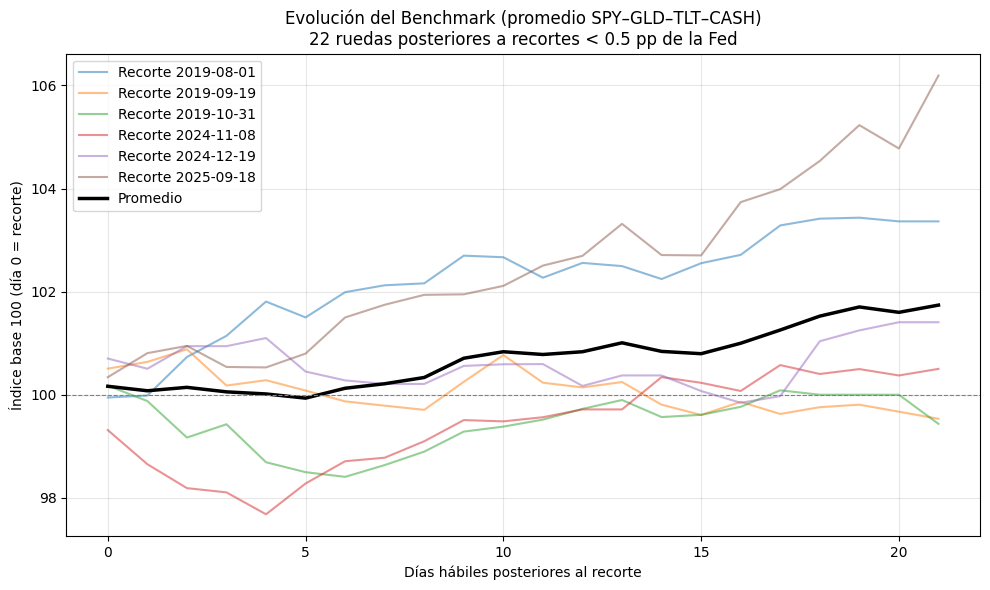


Estadísticas del benchmark:

Retorno acumulado por ventana:
2019-08-01: 3.36%
2019-09-19: -0.47%
2019-10-31: -0.56%
2024-11-08: 0.50%
2024-12-19: 1.41%
2025-09-18: 6.19%

Promedio: 1.74%


In [4]:
# ==========================================
# Evolución promedio del benchmark post-recortes (<0.5 pp)
# ==========================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import pandas_datareader.data as web

# ---------- Parámetros ----------
ASSETS = ["SPY", "GLD", "TLT", "CASH"]
RETURNS_FILE = "returns_used.csv"
WINDOW_TRADING_DAYS = 22
START_FED = "2015-01-01"
EXCLUDE_YEAR = 2020  # excluimos recortes de 2020 (COVID)

# ---------- 1) Obtener datos de la Fed (FRED) ----------
print("Descargando datos de tasas de la Fed...")
try:
    # Descargar la tasa de interés superior del rango objetivo de la Fed
    rates = web.DataReader('DFEDTARU', 'fred', START_FED)
    rates.index.name = 'date'
    rates.columns = ['upper']
    
    # Calcular cambios en la tasa
    rates['chg'] = rates['upper'].diff()
    
    # Detectar recortes entre 0.25pp y 0.5pp (excluyendo 2020)
    cut_dates = rates[(rates['chg'] <= -0.25) & 
                     (rates['chg'] > -0.5) & 
                     (rates.index.year != EXCLUDE_YEAR)].index
    
    print("\nRecortes detectados (<0.5 pp, sin 2020):")
    for d in cut_dates:
        print(f" • {d.date()} ({abs(rates.loc[d, 'chg']*100):.0f}bp)")
        
except Exception as e:
    print(f"Error al descargar datos de FRED: {e}")
    print("Usando fechas de ejemplo como fallback...")
    cut_dates = pd.to_datetime([
        "2019-07-31",
        "2019-09-18",
        "2019-10-30"
    ])

# ---------- 2) Leer retornos ----------
returns = pd.read_csv(RETURNS_FILE, index_col=0, parse_dates=True)
returns = returns[ASSETS].sort_index()

# ---------- 3) Crear ventanas post-corte ----------
frames = []
for d in cut_dates:
    idx = returns.index.searchsorted(d + pd.Timedelta(days=1))
    if idx >= len(returns.index):
        continue
    sample = returns.iloc[idx : idx + WINDOW_TRADING_DAYS].copy()
    if len(sample) >= WINDOW_TRADING_DAYS // 2:
        sample["window_id"] = d.date()
        frames.append(sample)

if not frames:
    raise RuntimeError("No se generaron ventanas post-recorte; revisá datos.")

df_all = pd.concat(frames, axis=0)
df_all.to_csv("ventanas_post_recorte_<0.5.csv")

# ---------- 4) Calcular índice base=100 del benchmark (promedio simple de activos) ----------
benchmarks = []
for date, block in df_all.groupby("window_id"):
    # índice 100 base
    idx_block = (1 + block[ASSETS]).cumprod() * 100
    idx_block["benchmark"] = idx_block[ASSETS].mean(axis=1)
    idx_block["window_id"] = date
    benchmarks.append(idx_block[["benchmark", "window_id"]])

df_bench = pd.concat(benchmarks, axis=0)

# ---------- 5) Calcular promedio entre todos los eventos ----------
# alineamos por número de día (0…21)
df_avg = pd.DataFrame()
for wid, data in df_bench.groupby("window_id"):
    s = data["benchmark"].reset_index(drop=True)
    df_avg[str(wid)] = s

df_avg["mean"] = df_avg.mean(axis=1)

# ---------- 6) Graficar evolución por recorte y promedio ----------
plt.figure(figsize=(10, 6))
for c in df_avg.columns[:-1]:
    plt.plot(df_avg.index, df_avg[c], alpha=0.5, label=f"Recorte {c}")
plt.plot(df_avg.index, df_avg["mean"], color="black", linewidth=2.5, label="Promedio")
plt.axhline(100, color="gray", linewidth=0.8, linestyle="--")
plt.title("Evolución del Benchmark (promedio SPY–GLD–TLT–CASH)\n22 ruedas posteriores a recortes < 0.5 pp de la Fed")
plt.xlabel("Días hábiles posteriores al recorte")
plt.ylabel("Índice base 100 (día 0 = recorte)")
# Leyenda dentro del box en la esquina superior izquierda
plt.legend(loc='upper left', frameon=True)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ---------- 7) Mostrar estadísticas ----------
print("\nEstadísticas del benchmark:")
print("\nRetorno acumulado por ventana:")
for col in df_avg.columns[:-1]:
    ret = (df_avg[col].iloc[-1] / 100 - 1) * 100
    print(f"{col}: {ret:.2f}%")
print(f"\nPromedio: {(df_avg['mean'].iloc[-1] / 100 - 1) * 100:.2f}%")

### Markowitz asociado a cuts

In [11]:
# ==========================================
# Markowitz sobre ventanas post-recortes (<0.5 pp)
# SIN CASH en la cartera (universo = SPY, GLD, TLT)
# rf = 0% (CML parte de 0)
# ==========================================
# Reqs: pip install cvxpy numpy pandas osqp

import numpy as np
import pandas as pd
import cvxpy as cp

# -------- Parámetros --------
VENTANAS_FILE = "ventanas_post_recorte_<0.5.csv"  # generado por tu script previo
ASSETS = ["SPY", "GLD", "TLT"]                    # sin CASH
RF = 0.0                                          # activo libre de riesgo fuera de la cartera
TRADING_DAYS_PER_YEAR = 252

# -------- 1) Cargar muestra condicionada (ventanas) --------
df_all = pd.read_csv(VENTANAS_FILE, index_col=0, parse_dates=True)

# nos quedamos con los tres activos
missing = [c for c in ASSETS if c not in df_all.columns]
if missing:
    raise RuntimeError(f"Faltan columnas en {VENTANAS_FILE}: {missing}")

ret = df_all[ASSETS].dropna(how="any")

# -------- 2) Estimar μ y Σ anualizados --------
mu = ret.mean() * TRADING_DAYS_PER_YEAR
Sigma = ret.cov() * TRADING_DAYS_PER_YEAR

# -------- 3) Markowitz (long-only, sum=1): GMV y Máximo Sharpe --------
S = Sigma.values.astype(float)
mu_vec = mu.values
N = len(ASSETS)

# Asegurar PSD (ridge diminuto)
S = S + 1e-10 * np.eye(N)

# ---- GMV (mínima varianza) ----
w_gmv = cp.Variable(N)
prob_gmv = cp.Problem(
    cp.Minimize(cp.quad_form(w_gmv, S)),
    [cp.sum(w_gmv) == 1, w_gmv >= 0]
)
try:
    prob_gmv.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, verbose=False)
except Exception:
    prob_gmv.solve(solver=cp.SCS, verbose=False)

w_gmv = w_gmv.value
ret_gmv = float(mu_vec @ w_gmv)
vol_gmv = float(np.sqrt(w_gmv @ S @ w_gmv))
sharpe_gmv = (ret_gmv - RF) / vol_gmv if vol_gmv > 0 else np.nan

# ---- Máximo Sharpe (rf=0): buscamos sobre la frontera ----
# Construimos la frontera minimizando varianza para un conjunto de retornos objetivo,
# y elegimos el punto con mayor Sharpe (rf=0).
mu_min = max(0.0, ret_gmv)
mu_max = float(mu_vec.max())
targets = np.linspace(mu_min, mu_max, 50)

rets, vols, weights = [], [], []
for r_target in targets:
    w = cp.Variable(N)
    prob_t = cp.Problem(
        cp.Minimize(cp.quad_form(w, S)),
        [cp.sum(w) == 1, w >= 0, mu_vec @ w >= r_target]
    )
    try:
        prob_t.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, verbose=False)
    except Exception:
        prob_t.solve(solver=cp.SCS, verbose=False)
    w_opt = w.value
    if w_opt is None:
        continue
    rp = float(mu_vec @ w_opt)
    sp = float(np.sqrt(w_opt @ S @ w_opt))
    if sp > 0:
        rets.append(rp); vols.append(sp); weights.append(w_opt)

rets = np.array(rets, dtype=float)
vols = np.array(vols, dtype=float)
sharpes = (rets - RF) / vols
idx = int(np.nanargmax(sharpes))
w_msr = weights[idx]
ret_msr, vol_msr, sharpe_msr = rets[idx], vols[idx], sharpes[idx]

# -------- 4) Resultados --------
out = pd.DataFrame({
    "w_GMV": w_gmv,
    "w_MSR": w_msr,
    "mu_postcuts": mu.values
}, index=ASSETS)

print("\n=== Pesos óptimos (post-recortes <0.5 pp, sin CASH) ===")
print(out.round(4))

print("\n=== Métricas (anualizadas) ===")
print(f"GMV  Ret / Vol : {ret_gmv:.4f} / {vol_gmv:.4f} | Sharpe = {sharpe_gmv:.3f}  (rf={RF:.2%})")
print(f"MSR  Ret / Vol : {ret_msr:.4f} / {vol_msr:.4f} | Sharpe = {sharpe_msr:.3f}  (rf={RF:.2%})")

# (Opcional) comparar con benchmark 1/3-1/3-1/3
w_eq = np.array([1/3, 1/3, 1/3], dtype=float)
ret_eq = float(mu_vec @ w_eq)
vol_eq = float(np.sqrt(w_eq @ S @ w_eq))
sharpe_eq = (ret_eq - RF) / vol_eq if vol_eq > 0 else np.nan

print("\n--- Benchmark 1/3-1/3-1/3 (SPY, GLD, TLT) ---")
print(f"EQ   Ret / Vol : {ret_eq:.4f} / {vol_eq:.4f} | Sharpe = {sharpe_eq:.3f}  (rf={RF:.2%})")



=== Pesos óptimos (post-recortes <0.5 pp, sin CASH) ===
      w_GMV   w_MSR  mu_postcuts
SPY  0.4251  0.3261       0.1365
GLD  0.1767  0.4702       0.4591
TLT  0.3982  0.2037       0.1814

=== Métricas (anualizadas) ===
GMV  Ret / Vol : 0.2114 / 0.0721 | Sharpe = 2.932  (rf=0.00%)
MSR  Ret / Vol : 0.2973 / 0.0854 | Sharpe = 3.480  (rf=0.00%)

--- Benchmark 1/3-1/3-1/3 (SPY, GLD, TLT) ---
EQ   Ret / Vol : 0.2590 / 0.0769 | Sharpe = 3.369  (rf=0.00%)


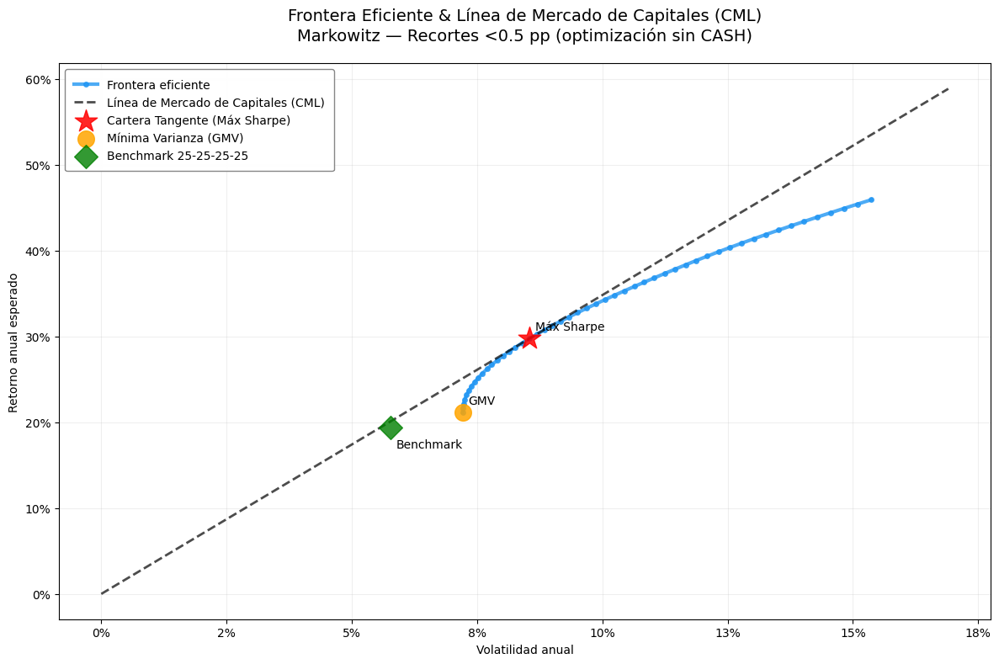


=== Benchmark 25-25-25-25 (SPY-GLD-TLT-CASH) ===
Retorno anual esperado: 0.1943
Volatilidad anual     : 0.0577
Ratio de Sharpe      : 3.369  (rf=0.00%)


In [13]:
# ==========================================
# Frontera eficiente con CML (matplotlib)
# ==========================================

import matplotlib.pyplot as plt
import numpy as np

# --- 1) Preparar puntos y línea CML ---
# pendiente (Sharpe de la tangente)
cml_slope = (ret_msr - RF) / vol_msr

# rango de volatilidades para la CML
vol_cml = np.linspace(0, max(vols) * 1.1, 50)
ret_cml = RF + cml_slope * vol_cml

# --- 2) Calcular benchmark 25-25-25-25 ---
# Extender mu y Sigma para incluir CASH
mu_with_cash = np.zeros(4)  # [SPY, GLD, TLT, CASH]
mu_with_cash[:3] = mu_vec   # primeros 3 son los retornos originales
mu_with_cash[3] = 0.0      # CASH rinde 0

Sigma_with_cash = np.zeros((4, 4))
Sigma_with_cash[:3, :3] = S  # submatriz 3x3 superior izquierda es la original
# resto queda en 0 (covarianzas con CASH = 0)

# Pesos del benchmark 25-25-25-25
w_bench = np.array([0.25, 0.25, 0.25, 0.25])
ret_bench = float(mu_with_cash @ w_bench)
vol_bench = float(np.sqrt(w_bench @ Sigma_with_cash @ w_bench))
sharpe_bench = (ret_bench - RF) / vol_bench if vol_bench > 0 else np.nan

# --- 3) Figura ---
plt.figure(figsize=(12, 8))

# Frontera eficiente
plt.plot(vols, rets, '-', color='#2196F3', alpha=0.8, linewidth=3, 
         marker='.', markersize=8, label='Frontera eficiente')

# CML
plt.plot(vol_cml, ret_cml, '--', color='black', alpha=0.7, linewidth=2,
         label='Línea de Mercado de Capitales (CML)')

# Punto óptimo (Máx Sharpe)
plt.scatter(vol_msr, ret_msr, marker='*', s=400, color='red', alpha=0.85, 
           label='Cartera Tangente (Máx Sharpe)', zorder=5)
plt.annotate('Máx Sharpe', (vol_msr, ret_msr), 
             xytext=(5, 5), textcoords='offset points', 
             ha='left', va='bottom')

# Punto de mínima varianza
plt.scatter(vol_gmv, ret_gmv, marker='o', s=200, color='orange', alpha=0.85,
           label='Mínima Varianza (GMV)', zorder=5)
plt.annotate('GMV', (vol_gmv, ret_gmv),
             xytext=(5, 5), textcoords='offset points',
             ha='left', va='bottom')

# Punto del benchmark 25-25-25-25
plt.scatter(vol_bench, ret_bench, marker='D', s=200, color='green', alpha=0.8,
           label='Benchmark 25-25-25-25', zorder=5)
plt.annotate('Benchmark', (vol_bench, ret_bench),
             xytext=(5, -10), textcoords='offset points',
             ha='left', va='top')

# --- 4) Estilo general ---
plt.title('Frontera Eficiente & Línea de Mercado de Capitales (CML)\nMarkowitz — Recortes <0.5 pp (optimización sin CASH)',
          pad=20, fontsize=14)
plt.xlabel('Volatilidad anual')
plt.ylabel('Retorno anual esperado')

# Formato de ejes en porcentaje
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: '{:.0%}'.format(x)))
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: '{:.0%}'.format(x)))

# Grid suave
plt.grid(True, alpha=0.2)

# Leyenda con estilo
plt.legend(loc='upper left', frameon=True, framealpha=0.95, 
          borderaxespad=0.5, borderpad=0.8, 
          edgecolor='gray', fontsize=10)

# Ajustes finales
plt.tight_layout()
plt.show()

# Imprimir métricas del benchmark
print("\n=== Benchmark 25-25-25-25 (SPY-GLD-TLT-CASH) ===")
print(f"Retorno anual esperado: {ret_bench:.4f}")
print(f"Volatilidad anual     : {vol_bench:.4f}")
print(f"Ratio de Sharpe      : {sharpe_bench:.3f}  (rf={RF:.2%})")

In [4]:
# ==========================================


import numpy as np
import pandas as pd
import cvxpy as cp

# -------- Parámetros --------
VENTANAS_FILE = "ventanas_post_recorte_<0.5.csv"  # generado por tu script previo
ASSETS = ["SPY", "GLD", "TLT", "CASH"]           # agregamos CASH
RF = 0.0                                          # activo libre de riesgo fuera de la cartera
TRADING_DAYS_PER_YEAR = 252

# -------- 1) Cargar muestra condicionada (ventanas) --------
df_all = pd.read_csv(VENTANAS_FILE, index_col=0, parse_dates=True)

# nos quedamos con todos los activos (incluyendo CASH)
missing = [c for c in ASSETS if c not in df_all.columns]
if missing:
    raise RuntimeError(f"Faltan columnas en {VENTANAS_FILE}: {missing}")

ret = df_all[ASSETS].dropna(how="any")

# -------- 2) Estimar μ y Σ anualizados --------
mu = ret.mean() * TRADING_DAYS_PER_YEAR
Sigma = ret.cov() * TRADING_DAYS_PER_YEAR

# Forzar CASH = 0% retorno y 0 riesgo
mu.loc["CASH"] = 0.0
Sigma.loc["CASH", :] = 0.0
Sigma.loc[:, "CASH"] = 0.0

# -------- 3) Markowitz (long-only, sum=1): GMV y Máximo Sharpe --------
S = Sigma.values.astype(float)
mu_vec = mu.values
N = len(ASSETS)

# Asegurar PSD (ridge diminuto)
S = S + 1e-10 * np.eye(N)

# ---- GMV (mínima varianza) ----
w_gmv = cp.Variable(N)
prob_gmv = cp.Problem(
    cp.Minimize(cp.quad_form(w_gmv, S)),
    [cp.sum(w_gmv) == 1, w_gmv >= 0]
)
try:
    prob_gmv.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, verbose=False)
except Exception:
    prob_gmv.solve(solver=cp.SCS, verbose=False)

w_gmv = w_gmv.value
ret_gmv = float(mu_vec @ w_gmv)
vol_gmv = float(np.sqrt(w_gmv @ S @ w_gmv))
sharpe_gmv = (ret_gmv - RF) / vol_gmv if vol_gmv > 0 else np.nan

# ---- Máximo Sharpe (rf=0): buscamos sobre la frontera ----
# Construimos la frontera minimizando varianza para un conjunto de retornos objetivo,
# y elegimos el punto con mayor Sharpe (rf=0).
mu_min = max(0.0, ret_gmv)
mu_max = float(mu_vec.max())
targets = np.linspace(mu_min, mu_max, 50)

rets, vols, weights = [], [], []
for r_target in targets:
    w = cp.Variable(N)
    prob_t = cp.Problem(
        cp.Minimize(cp.quad_form(w, S)),
        [cp.sum(w) == 1, w >= 0, mu_vec @ w >= r_target]
    )
    try:
        prob_t.solve(solver=cp.OSQP, eps_abs=1e-8, eps_rel=1e-8, verbose=False)
    except Exception:
        prob_t.solve(solver=cp.SCS, verbose=False)
    w_opt = w.value
    if w_opt is None:
        continue
    rp = float(mu_vec @ w_opt)
    sp = float(np.sqrt(w_opt @ S @ w_opt))
    if sp > 0:
        rets.append(rp); vols.append(sp); weights.append(w_opt)

rets = np.array(rets, dtype=float)
vols = np.array(vols, dtype=float)
sharpes = (rets - RF) / vols
idx = int(np.nanargmax(sharpes))
w_msr = weights[idx]
ret_msr, vol_msr, sharpe_msr = rets[idx], vols[idx], sharpes[idx]

# -------- 4) Resultados --------
out = pd.DataFrame({
    "w_GMV": w_gmv,
    "w_MSR": w_msr,
    "mu_postcuts": mu.values
}, index=ASSETS)

print("\n=== Pesos óptimos (post-recortes <0.5 pp, con CASH=0%) ===")
print(out.round(4))

print("\n=== Métricas (anualizadas) ===")
print(f"GMV  Ret / Vol : {ret_gmv:.4f} / {vol_gmv:.4f} | Sharpe = {sharpe_gmv:.3f}  (rf={RF:.2%})")
print(f"MSR  Ret / Vol : {ret_msr:.4f} / {vol_msr:.4f} | Sharpe = {sharpe_msr:.3f}  (rf={RF:.2%})")

# (Opcional) comparar con benchmark 25-25-25-25
w_eq = np.array([0.25, 0.25, 0.25, 0.25], dtype=float)
ret_eq = float(mu_vec @ w_eq)
vol_eq = float(np.sqrt(w_eq @ S @ w_eq))
sharpe_eq = (ret_eq - RF) / vol_eq if vol_eq > 0 else np.nan

print("\n--- Benchmark 25-25-25-25 (SPY, GLD, TLT, CASH) ---")
print(f"EQ   Ret / Vol : {ret_eq:.4f} / {vol_eq:.4f} | Sharpe = {sharpe_eq:.3f}  (rf={RF:.2%})")


=== Pesos óptimos (post-recortes <0.5 pp, con CASH=0%) ===
      w_GMV   w_MSR  mu_postcuts
SPY     0.0  0.3174       0.1365
GLD     0.0  0.4602       0.4591
TLT     0.0  0.1976       0.1814
CASH    1.0  0.0248       0.0000

=== Métricas (anualizadas) ===
GMV  Ret / Vol : 0.0000 / 0.0000 | Sharpe = 0.000  (rf=0.00%)
MSR  Ret / Vol : 0.2904 / 0.0835 | Sharpe = 3.480  (rf=0.00%)

--- Benchmark 25-25-25-25 (SPY, GLD, TLT, CASH) ---
EQ   Ret / Vol : 0.1943 / 0.0577 | Sharpe = 3.369  (rf=0.00%)


# Local Projections (Jordá)
Análisis del impacto dinámico de recortes de tasa en los activos usando la metodología de Jordá (2005).

In [28]:
# ==========================================
# Local Projections: Setup y datos
# ==========================================

import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as sm

# -------- Parámetros --------
ASSETS = ["SPY", "GLD", "TLT", "CASH"]
H_MAX = 6        # horizontes (semanas) a proyectar
LAGS = 2         # número de rezagos como controles
N_BOOT = 1000    # número de bootstraps para intervalos
CONF = 0.90      # nivel de confianza para intervalos

# -------- 1) Preparar datos --------
# Leer retornos y agrupar por semana
returns = pd.read_csv("returns_used.csv", index_col=0, parse_dates=True)
returns_weekly = returns.resample('W-FRI').agg(lambda x: (1 + x).prod() - 1)

# Cargar fechas de recortes y crear serie de tratamiento semanal
rates = pd.read_csv("ventanas_post_recorte_<0.5.csv", index_col=0, parse_dates=True)
cut_dates = rates.index.unique()
treatment = pd.Series(0, index=returns_weekly.index)
for date in cut_dates:
    # Encontrar la semana correspondiente al recorte
    week_end = returns_weekly.index[returns_weekly.index.searchsorted(date)]
    treatment.loc[week_end] = 1

# Verificación
print("Resumen de datos:")
print(f"Período: {returns_weekly.index[0].date()} → {returns_weekly.index[-1].date()}")
print(f"Número de semanas: {len(returns_weekly)}")
print(f"Número de recortes: {treatment.sum()}")
print("\nRecortes detectados:")
print(treatment[treatment == 1].index.strftime("%Y-%m-%d").tolist())

Resumen de datos:
Período: 2015-01-09 → 2025-10-31
Número de semanas: 565
Número de recortes: 35

Recortes detectados:
['2019-08-02', '2019-08-09', '2019-08-16', '2019-08-23', '2019-08-30', '2019-09-06', '2019-09-20', '2019-09-27', '2019-10-04', '2019-10-11', '2019-10-18', '2019-10-25', '2019-11-01', '2019-11-08', '2019-11-15', '2019-11-22', '2019-11-29', '2019-12-06', '2024-11-15', '2024-11-22', '2024-11-29', '2024-12-06', '2024-12-13', '2024-12-20', '2024-12-27', '2025-01-03', '2025-01-10', '2025-01-17', '2025-01-24', '2025-09-19', '2025-09-26', '2025-10-03', '2025-10-10', '2025-10-17', '2025-10-24']


In [29]:
# ==========================================
# Funciones auxiliares para Local Projections
# ==========================================

def prepare_lp_data(y, shock, controls, h, lags):
    """Prepara datos para la regresión de Local Projection en horizonte h."""
    # Variable dependiente: y_{t+h}
    y_h = y.shift(-h)
    
    # Controles: rezagos de y y otros controles
    X_controls = []
    for var in [y] + controls:
        for l in range(lags):
            X_controls.append(var.shift(l))
    
    # Juntar todo
    data = pd.concat([y_h, shock] + X_controls, axis=1)
    data = data.dropna()
    
    return data

def estimate_lp(y, shock, controls, h, lags):
    """Estima Local Projection para horizonte h."""
    # Preparar datos
    data = prepare_lp_data(y, shock, controls, h, lags)
    if len(data) == 0:
        return np.nan, np.nan
    
    # Separar X e y
    y_h = data.iloc[:, 0]
    X = sm.add_constant(data.iloc[:, 1:])
    
    # Regresión
    model = sm.OLS(y_h, X).fit()
    beta = model.params[1]  # coeficiente del shock
    se = model.bse[1]      # error estándar
    
    return beta, se

def bootstrap_lp(y, shock, controls, h, lags, n_boot=1000, conf=0.90):
    """Bootstrap para intervalos de confianza."""
    betas = np.zeros(n_boot)
    T = len(y)
    
    for b in range(n_boot):
        # Remuestreo por bloques
        idx = np.random.randint(0, T, size=T)
        y_boot = y.iloc[idx]
        shock_boot = shock.iloc[idx]
        controls_boot = [c.iloc[idx] for c in controls]
        
        # Estimar en muestra bootstrap
        beta, _ = estimate_lp(y_boot, shock_boot, controls_boot, h, lags)
        betas[b] = beta
    
    # Intervalos de confianza
    ci_lower = np.percentile(betas, (1-conf)*100/2)
    ci_upper = np.percentile(betas, 100-(1-conf)*100/2)
    
    return ci_lower, ci_upper

print("✓ Funciones auxiliares cargadas")

✓ Funciones auxiliares cargadas


In [30]:
# Initialize arrays to store IRFs and confidence intervals
irfs = np.zeros((len(ASSETS), H_MAX))
ci_lower = np.zeros((len(ASSETS), H_MAX))
ci_upper = np.zeros((len(ASSETS), H_MAX))

# For each asset
for idx, asset in enumerate(ASSETS):
    print(f"\nProcessing {asset}...")
    
    # Get the dependent variable (asset returns)
    y = returns_weekly[asset]
    
    # Prepare controls matrix (lagged returns for all assets)
    controls = []
    for lag in range(1, LAGS + 1):
        for control_asset in ASSETS:
            controls.append(returns_weekly[control_asset].shift(lag))
    
    # Convert controls to DataFrame
    controls_df = pd.concat(controls, axis=1)
    
    # For each horizon
    for h in range(H_MAX):
        # Create future returns as dependent variable
        y_future = y.shift(-(h))
        
        # Combine data
        data = pd.concat([y_future, treatment_weekly, controls_df], axis=1).dropna()
        
        # Split data
        Y = data.iloc[:, 0]  # Future returns
        X = data.iloc[:, 1]  # Treatment
        Z = data.iloc[:, 2:]  # Controls
        
        # Add constant to controls
        Z = sm.add_constant(Z)
        
        # Estimate model
        model = sm.OLS(Y, pd.concat([X, Z], axis=1))
        results = model.fit()
        
        # Store IRF point estimate
        irfs[idx, h] = results.params[0]
        
        # Bootstrap confidence intervals
        boot_irfs = np.zeros(N_BOOT)
        
        for b in range(N_BOOT):
            # Resample data
            boot_idx = np.random.randint(0, len(Y), size=len(Y))
            Y_boot = Y.iloc[boot_idx]
            X_boot = X.iloc[boot_idx]
            Z_boot = Z.iloc[boot_idx]
            
            # Estimate model on bootstrap sample
            model_boot = sm.OLS(Y_boot, pd.concat([X_boot, Z_boot], axis=1))
            results_boot = model_boot.fit()
            
            # Store bootstrap IRF
            boot_irfs[b] = results_boot.params[0]
        
        # Calculate confidence intervals
        ci_lower[idx, h] = np.percentile(boot_irfs, (1 - CONF) * 100 / 2)
        ci_upper[idx, h] = np.percentile(boot_irfs, (1 + CONF) * 100 / 2)


Processing SPY...


/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:43: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/


Processing GLD...


/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/


Processing TLT...


/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/


Processing CASH...


/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/ipykernel_15511/1705096266.py:60: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/nv/_2c69cnd7kvdvxvytywt_5zm0000gn/T/

AttributeError: 'OLSResults' object has no attribute 'items'

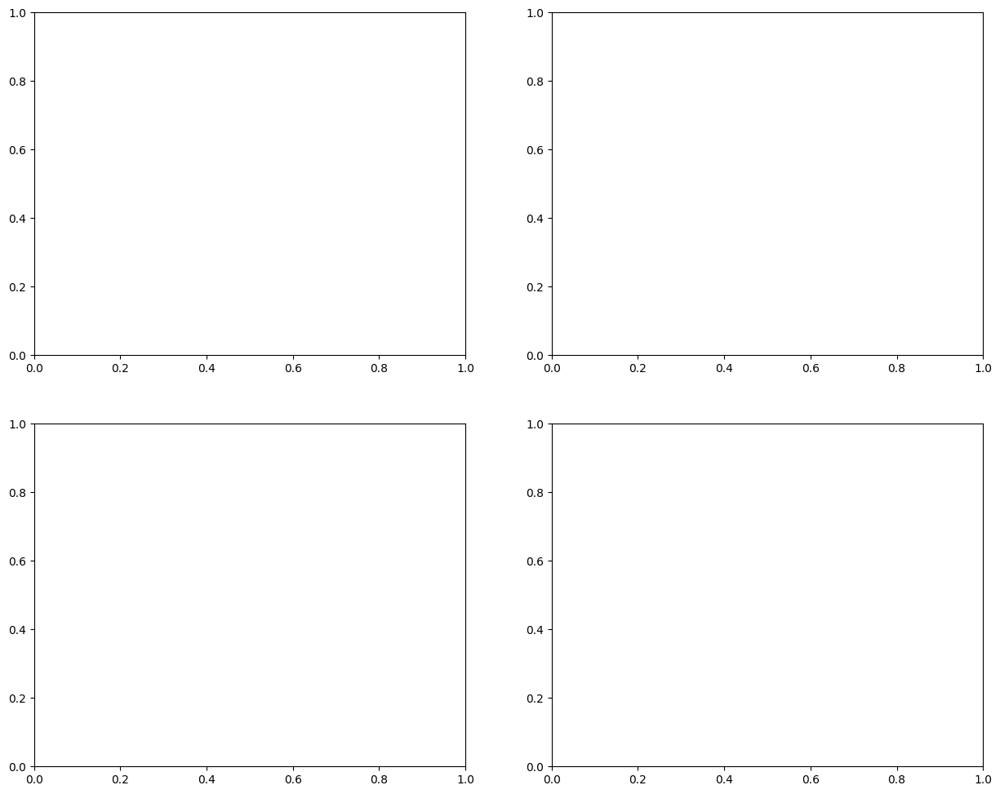

In [ ]:
# Create a figure with subplots for each asset
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

# Plot IRFs for each asset
for idx, asset in enumerate(ASSETS):
    ax = axes[idx]
    
    # Plot IRF
    ax.plot(range(H_MAX), irfs[idx], label='IRF', color='blue', linewidth=2)
    
    # Plot confidence intervals
    ax.fill_between(range(H_MAX), 
                   ci_lower[idx], 
                   ci_upper[idx],
                   color='blue', 
                   alpha=0.2, 
                   label=f'{int(CONF*100)}% CI')
    
    # Add horizontal line at y=0
    ax.axhline(y=0, color='red', linestyle='--', alpha=0.5)
    
    # Customize plot
    ax.set_title(f'IRF for {asset}')
    ax.set_xlabel('Horizonte (semanas)')
    ax.set_ylabel('Retorno Acumulado (%)')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper left', frameon=True)

# Adjust layout
plt.tight_layout()
plt.show()